[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/brilliantbeaver/alexpose/blob/main/experiments/sjepa/gavd5-drift/neurips-brain-body/01_gavd_manifest_and_youtube.ipynb)

# 01. GAVD manifests and YouTube source videos

Turn condition CSV folders into a sequence-level manifest, download each source once, and keep the original frame timeline intact.

**Research use only.** This tutorial does not diagnose a person or validate a clinical device.

**Run it:** locally, from `experiments/sjepa/gavd5-drift`, run `uv sync` and then `uv run jupyter lab neurips-brain-body`. In Colab, use the badge and run the setup cell. Restart the kernel after changing `experiments/sjepa/gavd5-drift/.env`.

**Keep the walk visible:** notebook 01 opens the source video, and notebook 02 shows frame, bbox, and skeleton alignment. Revisit those views whenever a latent or classifier result looks surprising.


In [1]:
from pathlib import Path
import os
import sys
import subprocess

IN_COLAB = "google.colab" in sys.modules
REPO_URL = "https://github.com/brilliantbeaver/alexpose.git"

if IN_COLAB:
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q",
        "numpy", "pandas", "scipy", "scikit-learn", "matplotlib",
        "seaborn", "torch", "tqdm", "python-dotenv", "yt-dlp[default]",
        "opencv-python-headless", "mediapipe<1", "joblib", "pyarrow",
    ])
    clone_dir = Path("/content/alexpose")
    if not (clone_dir / ".git").exists():
        subprocess.check_call(["git", "clone", "--depth", "1", REPO_URL, str(clone_dir)])
    os.chdir(clone_dir)


def find_project_root(start=None):
    env_root = os.getenv("ALEXPOSE_ROOT")
    if env_root:
        candidate = Path(env_root).expanduser().resolve()
        if (candidate / ".git").exists() and (candidate / "data" / "gavd").exists():
            return candidate
        print(f"Ignoring invalid ALEXPOSE_ROOT: {candidate}")
    start = Path(start or Path.cwd()).resolve()
    for candidate in [start, *start.parents]:
        if (candidate / ".git").exists() and (candidate / "data" / "gavd").exists():
            return candidate
    return start


PROJECT_ROOT = find_project_root()
EXPERIMENT_DIR = PROJECT_ROOT / "experiments" / "sjepa" / "gavd5-drift"
NOTEBOOK_DIR = EXPERIMENT_DIR / "neurips-brain-body"

try:
    from dotenv import load_dotenv
    load_dotenv(EXPERIMENT_DIR / ".env", override=False)
    load_dotenv(PROJECT_ROOT / ".env", override=False)
except Exception:
    pass

MODE = os.getenv("GAVD_MODE", "smoke").strip().lower()
if MODE not in {"smoke", "real"}:
    raise ValueError("GAVD_MODE must be smoke or real")
if MODE == "smoke":
    print(
        "SMOKE MODE: hand-authored motions test code paths only. "
        "They have no pathophysiological or clinical validity."
    )

PREFERRED_ROOT = Path(
    os.getenv(
        "GAVD4_ROOT",
        "/Users/pmui/vaults/worldmodels/gait/skeleton-jepa/gavd4",
    )
).expanduser()

requested_data = os.getenv("GAVD4_DATA_DIR") or os.getenv("GAVD_DATA_GAVD_DIR")
if requested_data and Path(requested_data).expanduser().exists():
    DATA_GAVD_DIR = Path(requested_data).expanduser()
elif requested_data:
    print(f"Ignoring missing GAVD CSV path: {Path(requested_data).expanduser()}")
    if (EXPERIMENT_DIR / "data-gavd").exists():
        DATA_GAVD_DIR = EXPERIMENT_DIR / "data-gavd"
    elif (PREFERRED_ROOT / "data-gavd").exists():
        DATA_GAVD_DIR = PREFERRED_ROOT / "data-gavd"
    else:
        DATA_GAVD_DIR = PROJECT_ROOT / "data" / "gavd"
elif (EXPERIMENT_DIR / "data-gavd").exists():
    DATA_GAVD_DIR = EXPERIMENT_DIR / "data-gavd"
elif (PREFERRED_ROOT / "data-gavd").exists():
    DATA_GAVD_DIR = PREFERRED_ROOT / "data-gavd"
else:
    DATA_GAVD_DIR = PROJECT_ROOT / "data" / "gavd"

requested_youtube = os.getenv("GAVD4_YOUTUBE_DIR") or os.getenv("GAVD_YOUTUBE_DIR")
if requested_youtube:
    YOUTUBE_DIR = Path(requested_youtube).expanduser()
elif PREFERRED_ROOT.exists():
    YOUTUBE_DIR = PREFERRED_ROOT / "youtube"
else:
    YOUTUBE_DIR = PROJECT_ROOT / "experiments" / "sjepa" / "gavd5-drift" / "work" / "youtube"

CACHE_DIR = Path(
    os.getenv("GAVD_CACHE_DIR", EXPERIMENT_DIR / "work" / "cache")
).expanduser()
ARTIFACT_ROOT = Path(
    os.getenv("GAVD_ARTIFACT_DIR", EXPERIMENT_DIR / "work" / "artifacts")
).expanduser()
ARTIFACT_DIR = ARTIFACT_ROOT / MODE
POSE_DIR = ARTIFACT_DIR / "poses"

for folder in [CACHE_DIR, ARTIFACT_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

os.environ.setdefault("MPLCONFIGDIR", str(CACHE_DIR / "matplotlib"))
os.environ.setdefault("XDG_CACHE_HOME", str(CACHE_DIR / "xdg-cache"))
Path(os.environ["MPLCONFIGDIR"]).mkdir(parents=True, exist_ok=True)
Path(os.environ["XDG_CACHE_HOME"]).mkdir(parents=True, exist_ok=True)

import numpy as np
import pandas as pd
from IPython.display import SVG, display


def show_tutorial_svg(filename):
    '''Render a repository SVG reliably in local Jupyter and Colab.'''
    path = EXPERIMENT_DIR / "images" / filename
    if not path.exists():
        raise FileNotFoundError(
            f"Missing tutorial figure {path}. Clone the full alexpose repository."
        )
    display(SVG(filename=str(path)))

print(f"mode: {MODE}")
print(f"project: {PROJECT_ROOT}")
print(f"workshop notebooks: {NOTEBOOK_DIR}")
print(f"GAVD CSVs: {DATA_GAVD_DIR}")
print(f"YouTube cache: {YOUTUBE_DIR}")
print(f"artifacts: {ARTIFACT_DIR}")


mode: real
project: C:\Users\alexm\dev\alexpose
workshop notebooks: C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\neurips-brain-body
GAVD CSVs: C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\data-gavd
YouTube cache: C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\work\youtube
artifacts: C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\work\artifacts\real


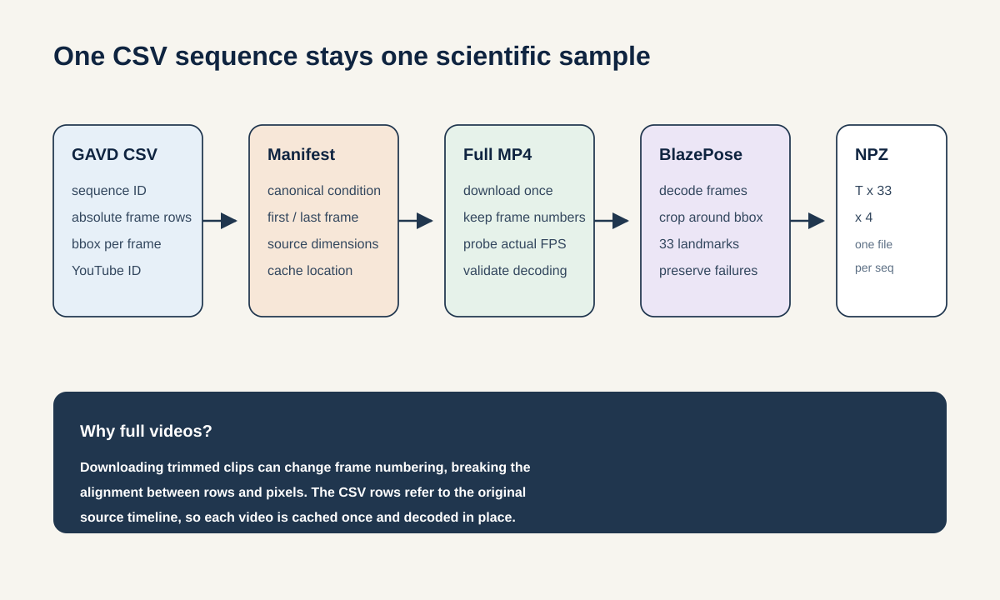

In [2]:
show_tutorial_svg("04_gavd_pipeline.svg")


## The evaluation boundary: a YouTube source, not a clip

One YouTube upload can contribute several annotated gait sequences. Those clips share the same person, camera, compression, background, and pose-estimation failure modes. A sequence-level random split can therefore put near-duplicates on both sides and make memorization look like generalization. The independent unit available in GAVD is the source `video_id`: every sequence from one source must inherit the same role.

**Inductive evaluation** keeps a source video completely unseen by the encoder, predictor, readout, and model-selection logic until testing. **Transductive evaluation** lets the representation learn from the eventual test inputs, even without their labels. Transductive analysis can describe a fixed corpus, but it cannot estimate performance on a new source.

The frozen protocol uses five outer source-grouped folds. Within each outer fold, development sources are separated again into train and validation roles. Train sources receive gradient updates; validation sources choose hyperparameters and stopping; test sources are opened once after the checkpoint is frozen. Each source is outer-test exactly once. Folder labels help balance folds but never permit a source to cross roles.

Availability and quality are separate gates. The split registry is frozen from a dated metadata-public snapshot. Later decoded-frame or pose-QC failures are recorded against that registry rather than causing a convenient re-split. This protects the test boundary while keeping attrition auditable.


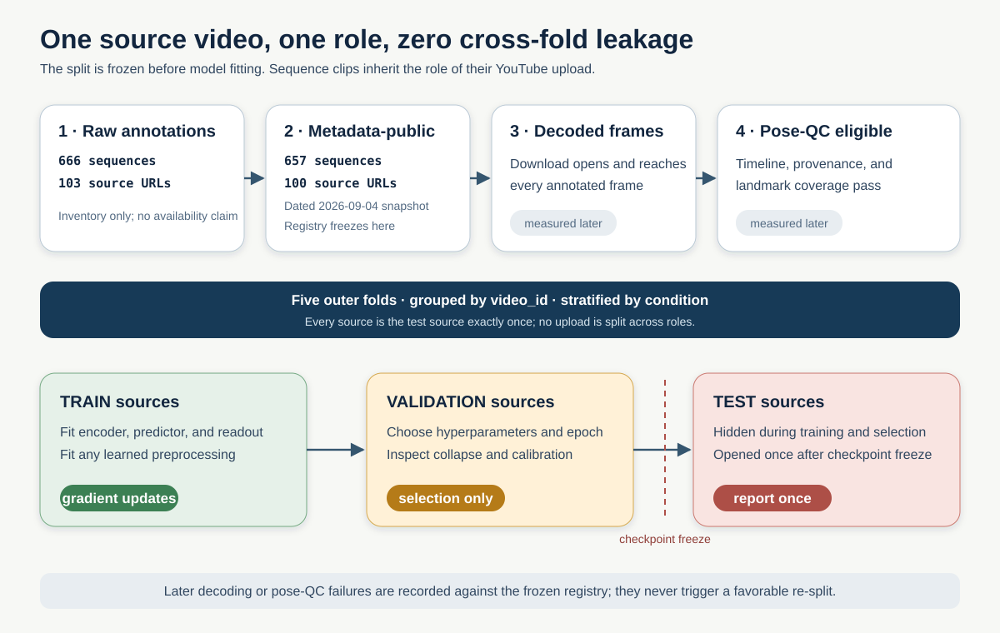

In [3]:
show_tutorial_svg("22_inductive_source_split.svg")


## How to read the progress display

Five stages freeze the metadata-public manifest and source split, persist its
hash contract, report the cohort census, verify source-role separation, and
audit or download source videos. The final stage can dominate when network work
is enabled. A completed bar means the audit ran; residual retryable or terminal
download rows remain explicit eligibility evidence and are not hidden by the
progress status.


In [4]:
if str(NOTEBOOK_DIR) not in sys.path:
    sys.path.insert(0, str(NOTEBOOK_DIR))
from notebook_progress import NotebookTaskProgress

manifest_progress = NotebookTaskProgress(
    'Manifest and source-audit progress',
    "stage",
    refresh_seconds=0.5,
)
manifest_progress.start(5, profile=MODE,
    note='Download time is service-dependent; eligibility rows remain authoritative.')

with manifest_progress.unit(1, "Scan metadata and freeze source-level roles"):
    # Notebook 01 is the single authority for source inventory and fold assignment.
    # Downstream notebooks read its frozen artifacts; they do not maintain dead-video lists.
    if str(NOTEBOOK_DIR) not in sys.path:
        sys.path.insert(0, str(NOTEBOOK_DIR))

    from evaluation_protocol import (
        CONDITIONS,
        DEFAULT_SPLIT_SEED,
        apply_availability_snapshot,
        build_nested_split_registry,
        manifest_fingerprint,
        scan_sequence_manifest,
        source_table,
        split_fingerprint,
        validate_split_registry,
        write_split_bundle,
    )

    VALIDITY_SNAPSHOT = NOTEBOOK_DIR / "docs" / "youtube_validity_2026-09-04.csv"
    PROTOCOL_DIR = ARTIFACT_DIR / "evaluation_protocol"

    if not VALIDITY_SNAPSHOT.is_file():
        raise FileNotFoundError(
            f"Missing dated URL snapshot: {VALIDITY_SNAPSHOT}. "
            "Run refresh_youtube_validity.py before rebuilding the protocol."
        )

    # Gate 0: inventory every CSV. No URL or quality decision is made here.
    raw_manifest = scan_sequence_manifest(DATA_GAVD_DIR)

    # Gate 1: retain only sources marked public in the immutable dated snapshot.
    # This says only that metadata resolved. It does not claim that the selected
    # media file decodes through the final annotated frame.
    metadata_public_manifest = apply_availability_snapshot(
        raw_manifest, VALIDITY_SNAPSHOT, accepted_statuses=("public",)
    )
    # The snapshot repeats the canonical URL for audit readability. Collapse
    # pandas' merge suffixes only after proving the two sources agree.
    if {"url_x", "url_y"}.issubset(metadata_public_manifest.columns):
        if not metadata_public_manifest["url_x"].eq(
            metadata_public_manifest["url_y"]
        ).all():
            raise ValueError("Manifest and validity snapshot disagree on source URLs")
        metadata_public_manifest = metadata_public_manifest.rename(
            columns={"url_x": "url"}
        ).drop(columns=["url_y"])
    metadata_public_manifest["source_height"] = np.nan
    metadata_public_manifest["source_width"] = np.nan
    metadata_public_manifest["eligibility_stage"] = "metadata_public"
    metadata_public_manifest["decoded_frame_eligible"] = "pending_download_audit"
    metadata_public_manifest["pose_qc_eligible"] = "pending_notebook_02"

    # Freeze source roles now. Later decode or pose failures remain attached to these
    # assignments and never trigger a favorable re-split.
    source_split_registry = build_nested_split_registry(
        metadata_public_manifest,
        outer_splits=5,
        inner_splits=4,
        seed=DEFAULT_SPLIT_SEED,
    )
    validate_split_registry(source_split_registry, metadata_public_manifest)

    # `manifest` remains the compatibility name used by the download and preview
    # cells below. At this point it means metadata-public candidate sequences.
    manifest = metadata_public_manifest.copy()


## Four different cohort statements

One CSV is one annotated sequence, but one source video can contribute many CSVs. The ten original GAVD columns are `seq`, `frame_num`, `cam_view`, `gait_event`, `dataset`, `gait_pat`, `bbox`, `vid_info`, `id`, and `url`. `frame_num` is a 1-based absolute frame number in the source, not a clip-relative counter.

The notebook deliberately reports four non-interchangeable gates:

1. **Raw annotations:** every CSV in the five folders—666 sequences from 103 source URLs in the current checkout.
2. **Metadata-public:** the dated 2026-09-04 URL audit—657 sequences from 100 public sources. This is the population used to freeze source folds.
3. **Decoded-frame eligible:** a downloaded media file opens, has a valid FPS, and reaches the largest annotated frame. This is established by the download audit below.
4. **Pose-QC eligible:** notebook 02 confirms timeline alignment, provenance, and the predeclared landmark-coverage rule. This is not knowable from YouTube metadata.

Counts are always recomputed from artifacts; they are not encoded as expected constants or a hand-maintained dead-video set. Folder condition values and the original dataset annotations are retained, but they are dataset labels rather than independently verified diagnoses.


In [5]:
with manifest_progress.unit(2, "Persist the manifest and split hash contract"):
    display(manifest.head())

    raw_manifest_path = PROTOCOL_DIR / "raw_sequence_manifest.csv"
    public_manifest_path = PROTOCOL_DIR / "metadata_public_sequence_manifest.csv"
    PROTOCOL_DIR.mkdir(parents=True, exist_ok=True)
    raw_manifest.to_csv(raw_manifest_path, index=False)
    metadata_public_manifest.to_csv(public_manifest_path, index=False)

    # The bundle contains the candidate manifest, five-fold source registry, and a
    # machine-readable hash contract. Notebook 02 consumes these exact files.
    split_contract = write_split_bundle(
        metadata_public_manifest, source_split_registry, PROTOCOL_DIR
    )
    legacy_manifest_path = ARTIFACT_DIR / "manifest.csv"
    metadata_public_manifest.to_csv(legacy_manifest_path, index=False)

    print(f"wrote {raw_manifest_path}")
    print(f"wrote {public_manifest_path}")
    print(f"wrote {PROTOCOL_DIR / 'source_split_registry.csv'}")
    print(f"manifest SHA-256: {split_contract['manifest_sha256']}")
    print(f"split SHA-256:    {split_contract['split_sha256']}")


,condition,sequence_id,video_id,url,csv_path,first_frame,last_frame,n_annotated_frames,cam_view,dataset_annotation,...,title,metadata_fps,error,checked_at_utc,yt_dlp_version,source_height,source_width,eligibility_stage,decoded_frame_eligible,pose_qc_eligible
0,cerebralpalsy,cljwrq524003j3n6lt19gnyf5,-MQBffDuto4,https://www.youtube.com/watch?v=-MQBffDuto4,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,1,202,202,back,Abnormal Gait,...,Scissors gait,30.0,NaN,2026-09-05T04:12:31+00:00,2026.07.04,NaN,NaN,metadata_public,pending_download_audit,pending_notebook_02
1,cerebralpalsy,cljwrqwc9003n3n6ltzrvje9c,-MQBffDuto4,https://www.youtube.com/watch?v=-MQBffDuto4,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,243,441,199,front,Abnormal Gait,...,Scissors gait,30.0,NaN,2026-09-05T04:12:31+00:00,2026.07.04,NaN,NaN,metadata_public,pending_download_audit,pending_notebook_02
2,cerebralpalsy,cljvwb1h6001p3n6l138k9qo4,338R10fA_wU,https://www.youtube.com/watch?v=338R10fA_wU,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,484,809,326,left side,Abnormal Gait,...,walking with spastic Bilateral CP / / / a da...,30.0,NaN,2026-09-05T04:12:31+00:00,2026.07.04,NaN,NaN,metadata_public,pending_download_audit,pending_notebook_02
3,cerebralpalsy,cljvwbtul001t3n6lu4qeic4a,338R10fA_wU,https://www.youtube.com/watch?v=338R10fA_wU,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,889,1138,250,left side,Abnormal Gait,...,walking with spastic Bilateral CP / / / a da...,30.0,NaN,2026-09-05T04:12:31+00:00,2026.07.04,NaN,NaN,metadata_public,pending_download_audit,pending_notebook_02
4,cerebralpalsy,cljvwd8v1001x3n6l4kctzozr,338R10fA_wU,https://www.youtube.com/watch?v=338R10fA_wU,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,4520,4939,420,front,Abnormal Gait,...,walking with spastic Bilateral CP / / / a da...,30.0,NaN,2026-09-05T04:12:31+00:00,2026.07.04,NaN,NaN,metadata_public,pending_download_audit,pending_notebook_02


wrote C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\work\artifacts\real\evaluation_protocol\raw_sequence_manifest.csv
wrote C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\work\artifacts\real\evaluation_protocol\metadata_public_sequence_manifest.csv
wrote C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\work\artifacts\real\evaluation_protocol\source_split_registry.csv
manifest SHA-256: 7fd559e5105b11011a3e5c194b7ccc29729c56491c424745834df39884123b5a
split SHA-256:    ff3518b87b1d1fa7d95efb1aea1711773137a21699967cb8015edb8d845ccbe1


## Count both sequences and independent sources

Sequence count describes annotation volume; source count describes independent uploads. Both are shown for the raw and metadata-public gates. The split summary is source-level, so a video with twenty clips does not masquerade as twenty independent test cases.

The shared registry builder owns the allocation policy; this notebook exposes its per-role source and sequence counts rather than assuming that clip balance implies source balance. Contract assertions require train, validation, and test source sets to be disjoint in every outer fold and require every public source to serve as outer-test exactly once.


In [6]:
with manifest_progress.unit(3, "Compute gate and role censuses"):
    def cohort_census(frame, gate):
        table = (
            frame.groupby("condition")
            .agg(
                sequences=("sequence_id", "nunique"),
                annotated_frames=("n_annotated_frames", "sum"),
                unique_videos=("video_id", "nunique"),
            )
            .reindex(CONDITIONS)
            .reset_index()
        )
        table.insert(0, "gate", gate)
        return table


    census = pd.concat(
        [
            cohort_census(raw_manifest, "raw_annotation"),
            cohort_census(metadata_public_manifest, "metadata_public"),
        ],
        ignore_index=True,
    )
    display(census)
    census.to_csv(PROTOCOL_DIR / "source_video_census.csv", index=False)

    fold_roles = (
        source_split_registry.groupby(["outer_fold", "role", "condition"])
        .agg(source_videos=("video_id", "nunique"), sequences=("sequences", "sum"))
        .reset_index()
    )
    display(fold_roles)
    fold_roles.to_csv(PROTOCOL_DIR / "source_split_census.csv", index=False)

    print(
        "raw:", raw_manifest["sequence_id"].nunique(), "sequences /",
        raw_manifest["video_id"].nunique(), "sources",
    )
    print(
        "metadata-public:", metadata_public_manifest["sequence_id"].nunique(),
        "sequences /", metadata_public_manifest["video_id"].nunique(), "sources",
    )


,gate,condition,sequences,annotated_frames,unique_videos
0,raw_annotation,normal,291,41340,32
1,raw_annotation,parkinsons,47,10426,11
2,raw_annotation,stroke,76,33934,19
3,raw_annotation,myopathic,188,34595,30
4,raw_annotation,cerebralpalsy,64,20346,11
5,metadata_public,normal,291,41340,32
6,metadata_public,parkinsons,47,10426,11
7,metadata_public,stroke,75,32930,18
8,metadata_public,myopathic,184,33992,29
9,metadata_public,cerebralpalsy,60,19002,10


,outer_fold,role,condition,source_videos,sequences
0,0,test,cerebralpalsy,2,14
1,0,test,myopathic,6,37
2,0,test,normal,7,56
3,0,test,parkinsons,2,9
4,0,test,stroke,3,15
...,...,...,...,...,...
70,4,validation,cerebralpalsy,2,10
71,4,validation,myopathic,6,37
72,4,validation,normal,7,58
73,4,validation,parkinsons,2,10


raw: 666 sequences / 103 sources
metadata-public: 657 sequences / 100 sources


The current dated inventory contains **666 raw annotated sequences from 103 source URLs**. The 2026-09-04 metadata snapshot marks **657 sequences from 100 source videos** public. Those figures describe URL metadata only; they must not be silently reused as decoded-frame or pose-ready counts.

Every later table should therefore name its gate and its unit. A change in YouTube availability creates a new dated snapshot and new manifest hash; it does not overwrite the historical audit or quietly alter a published split.


In [7]:
with manifest_progress.unit(4, "Verify source concentration and role separation"):
    video_concentration = (
        source_table(metadata_public_manifest)
        .sort_values(["condition", "sequences"], ascending=[True, False])
    )
    display(video_concentration)
    video_concentration.to_csv(
        PROTOCOL_DIR / "source_video_concentration.csv", index=False
    )

    # One compact fold makes the no-overlap contract tangible. The full registry
    # contains all five outer folds and is the authoritative artifact.
    fold_zero = source_split_registry.loc[
        source_split_registry["outer_fold"].eq(0)
    ]
    fold_zero_overlap = {
        role: set(fold_zero.loc[fold_zero["role"].eq(role), "video_id"])
        for role in ("train", "validation", "test")
    }
    assert not (fold_zero_overlap["train"] & fold_zero_overlap["validation"])
    assert not (fold_zero_overlap["train"] & fold_zero_overlap["test"])
    assert not (fold_zero_overlap["validation"] & fold_zero_overlap["test"])
    display(
        fold_zero.groupby(["role", "condition"])
        .agg(source_videos=("video_id", "nunique"), sequences=("sequences", "sum"))
    )


,condition,video_id,sequences,annotated_frames,first_frame,last_frame
8,cerebralpalsy,rWKYDfklSkE,16,6055,1,6424
1,cerebralpalsy,338R10fA_wU,12,3162,484,7899
2,cerebralpalsy,DlPDuHBAP7A,8,2218,1,2974
9,cerebralpalsy,wRntYsztIEY,8,3328,1,3891
3,cerebralpalsy,SiYe89_WaTQ,6,2441,1,3198
...,...,...,...,...,...,...
85,stroke,B4rOTkTPbMI,2,235,87,388
92,stroke,dvfeYnWVD08,2,312,380,700
95,stroke,kA40kglSmYw,2,687,355,4275
84,stroke,9VzOTO0nV8U,1,166,1,166


source_videos  sequences
role       condition                              
test       cerebralpalsy              2         14
           myopathic                  6         37
           normal                     7         56
           parkinsons                 2          9
           stroke                     3         15
train      cerebralpalsy              6         38
           myopathic                 17        111
           normal                    19        169
           parkinsons                 7         29
           stroke                    11         45
validation cerebralpalsy              2          8
           myopathic                  6         36
           normal                     6         66
           parkinsons                 2          9
           stroke                     4         15

## Download once; retry only failures that can actually improve

Set `GAVD_MODE=real` and `GAVD_DOWNLOAD=1`. Full videos are cached as `youtube/condition/video_id.ext`, preserving the CSV's absolute frame numbers. Each cached file must open, report positive FPS and frame count, decode its first frame, and decode the source's last annotated frame.

Error handling follows the data semantics rather than treating every unsuccessful row alike:

- **Terminal source attrition is not retried.** A valid file that ends before its annotations, a private video, an unavailable video, or a copyright removal cannot improve through an immediate repeat. It remains in the frozen registry with `decoded_frame_eligible=False`. In particular, the 228-frame `n93bgWhLZk4` media cannot satisfy annotations through frame 458.
- **Retryable acquisition failures are bounded.** Anti-bot, throttling, timeout, transient server/network, client-specific availability, and format-selection errors try each of four strategies at most once: embedded client, TV client, HLS, then a permissive muxed-format fallback. Cooldowns grow between strategies; yt-dlp's internal fragment retries are capped at two.
- **The audit is written before policy enforcement.** Every row records its failure kind, retry recommendation, attempt count, strategies, and attempt log. Rerunning resumes from valid cached files instead of downloading them again.
- **Infrastructure and integrity errors still fail loudly.** A wrong returned video ID, an unavailable JavaScript runtime, a filesystem error, or a programming error is not dataset attrition and is never converted into an exclusion row.
- **Residual failures are warnings by default.** Downstream work continues on the decoded-eligible subset without redrawing folds. Set `GAVD_STRICT_DOWNLOADS=1` only when CI or a release gate should reject any residual exclusion. `GAVD_RETRY_COOLDOWN_SECONDS` controls the base cooldown.

This is intentionally stricter than URL metadata and more useful than an all-or-nothing exception. A public page can still lack a usable format, decode incorrectly, or end before an annotation. Notebook 02 later applies the distinct pose-QC gate.


In [8]:
with manifest_progress.unit(5, "Download or audit every metadata-public source"):
    from youtube_download import (
        DownloadBatchError,
        audit_cached_videos,
        cached_video_path as _cached_video_path,
        download_unique_videos,
        failure_summary,
        validate_video,
    )


    def cached_video_path(condition, video_id):
        """Notebook-local compatibility wrapper used by the preview cell."""
        return _cached_video_path(YOUTUBE_DIR, condition, video_id)


    DOWNLOAD_VIDEOS = MODE == "real" and os.getenv("GAVD_DOWNLOAD", "0") == "1"
    STRICT_DOWNLOADS = os.getenv("GAVD_STRICT_DOWNLOADS", "0") == "1"
    RETRY_COOLDOWN_SECONDS = float(os.getenv("GAVD_RETRY_COOLDOWN_SECONDS", "5"))
    MAX_VIDEOS = None

    if DOWNLOAD_VIDEOS:
        download_report = download_unique_videos(
            manifest,
            YOUTUBE_DIR,
            max_videos=MAX_VIDEOS,
            retry_cooldown_seconds=RETRY_COOLDOWN_SECONDS,
        )
    else:
        print("Download skipped. Set GAVD_MODE=real and GAVD_DOWNLOAD=1 to enable it.")
        download_report = audit_cached_videos(manifest, YOUTUBE_DIR)

    display(download_report)
    download_report.to_csv(
        PROTOCOL_DIR / "video_download_audit.csv", index=False
    )

    # Gate 2 is attached to the frozen metadata-public registry. Do not remove a
    # failed source and redraw folds: attrition must remain visible and reproducible.
    decoded_status = download_report[
        [
            "video_id", "ok", "fps", "frames", "required_last_frame",
            "reaches_annotation", "last_annotated_frame_decoded", "path",
            "failure_kind", "retry_recommended", "attempt_count",
        ]
    ].copy()
    decoded_status["decoded_frame_eligible"] = (
        decoded_status["ok"].fillna(False).astype(bool)
    )
    manifest = metadata_public_manifest.drop(
        columns=["decoded_frame_eligible"], errors="ignore"
    ).merge(decoded_status, on="video_id", how="left", validate="many_to_one")
    manifest["decoded_frame_eligible"] = manifest[
        "decoded_frame_eligible"
    ].fillna(False).astype(bool)
    manifest["eligibility_stage"] = "decoded_frame_audited"
    manifest["pose_qc_eligible"] = "pending_notebook_02"

    split_contract = write_split_bundle(manifest, source_split_registry, PROTOCOL_DIR)
    decoded_census = cohort_census(
        manifest.loc[manifest["decoded_frame_eligible"]], "decoded_frame_eligible"
    )
    display(decoded_census)
    decoded_census.to_csv(PROTOCOL_DIR / "decoded_frame_census.csv", index=False)
    print(
        "decoded-frame eligible:",
        int(manifest["decoded_frame_eligible"].sum()), "sequences /",
        manifest.loc[manifest["decoded_frame_eligible"], "video_id"].nunique(),
        "sources",
    )

    # Residual failures are expected observations, not necessarily notebook bugs.
    # Persist the ledger first, distinguish retryable failures from terminal source
    # attrition, and continue with the eligible subset unless strict CI mode is set.
    download_failures = failure_summary(download_report)
    if download_failures["failed_sources"]:
        failure_rows = download_report.loc[
            ~download_report["ok"].fillna(False).astype(bool),
            [
                "video_id", "status", "failure_kind", "retry_recommended",
                "attempt_count", "frames", "required_last_frame", "reason", "error",
            ],
        ]
        display(failure_rows)
        if download_failures["terminal_exclusions"]:
            print(
                "Terminal source exclusions (do not retry):",
                download_failures["terminal_exclusions"],
            )
        if download_failures["retryable_sources"]:
            print(
                "Retryable acquisition failures (safe to resume later):",
                download_failures["retryable_sources"],
            )
        print(
            "Continuing with the decoded-frame-eligible subset; the frozen source "
            "registry is unchanged and attrition remains visible in the audit."
        )
        if STRICT_DOWNLOADS:
            raise DownloadBatchError(
                "Strict download mode rejected residual failures: "
                + json.dumps(download_failures, sort_keys=True)
            )
manifest_progress.complete(status="Manifest and source audit complete")


[youtube] Extracting URL: https://www.youtube.com/watch?v=hGNKzkCF4J8
[youtube] hGNKzkCF4J8: Downloading webpage
[youtube] hGNKzkCF4J8: Downloading web embedded client config
[youtube] hGNKzkCF4J8: Downloading player f572e43c-main
[youtube] hGNKzkCF4J8: Downloading web embedded player API JSON


ERROR: [youtube] hGNKzkCF4J8: Video unavailable


Cooling down 5s before hGNKzkCF4J8 strategy=tv
[youtube] Extracting URL: https://www.youtube.com/watch?v=hGNKzkCF4J8
[youtube] hGNKzkCF4J8: Downloading webpage
[youtube] hGNKzkCF4J8: Downloading tv downgraded player API JSON


ERROR: [youtube] hGNKzkCF4J8: Sign in to confirm you’re not a bot. Use --cookies-from-browser or --cookies for the authentication. See  https://github.com/yt-dlp/yt-dlp/wiki/FAQ#how-do-i-pass-cookies-to-yt-dlp  for how to manually pass cookies. Also see  https://github.com/yt-dlp/yt-dlp/wiki/Extractors#exporting-youtube-cookies  for tips on effectively exporting YouTube cookies


Cooling down 10s before hGNKzkCF4J8 strategy=hls
[youtube] Extracting URL: https://www.youtube.com/watch?v=hGNKzkCF4J8
[youtube] hGNKzkCF4J8: Downloading webpage
[youtube] hGNKzkCF4J8: Downloading android vr player API JSON


ERROR: [youtube] hGNKzkCF4J8: Requested format is not available. Use --list-formats for a list of available formats


Cooling down 20s before hGNKzkCF4J8 strategy=fallback
[youtube] Extracting URL: https://www.youtube.com/watch?v=hGNKzkCF4J8
[youtube] hGNKzkCF4J8: Downloading webpage
[youtube] hGNKzkCF4J8: Downloading web embedded client config
[youtube] hGNKzkCF4J8: Downloading player f572e43c-main
[youtube] hGNKzkCF4J8: Downloading web embedded player API JSON
[youtube] hGNKzkCF4J8: Downloading tv downgraded player API JSON


ERROR: [youtube] hGNKzkCF4J8: Video unavailable


,condition,video_id,url,required_last_frame,source_height,status,path,error,attempt_count,strategies_attempted,...,frames,reaches_annotation,decode_opened,first_frame_decoded,last_annotated_frame_decoded,size_mb,ok,reason,failure_kind,retry_recommended
0,cerebralpalsy,-MQBffDuto4,https://www.youtube.com/watch?v=-MQBffDuto4,441,NaN,cached,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,NaN,0,,...,441,True,True,True,True,0.396736,True,ok,NaN,False
1,cerebralpalsy,338R10fA_wU,https://www.youtube.com/watch?v=338R10fA_wU,7899,NaN,cached,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,NaN,0,,...,7899,True,True,True,True,55.950280,True,ok,NaN,False
2,cerebralpalsy,DlPDuHBAP7A,https://www.youtube.com/watch?v=DlPDuHBAP7A,2974,NaN,cached,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,NaN,0,,...,3572,True,True,True,True,15.197321,True,ok,NaN,False
3,cerebralpalsy,SiYe89_WaTQ,https://www.youtube.com/watch?v=SiYe89_WaTQ,3198,NaN,cached,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,NaN,0,,...,4238,True,True,True,True,23.290250,True,ok,NaN,False
4,cerebralpalsy,Uj89KJwLYOY,https://www.youtube.com/watch?v=Uj89KJwLYOY,726,NaN,cached,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,NaN,0,,...,849,True,True,True,True,3.523659,True,ok,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,stroke,kA40kglSmYw,https://www.youtube.com/watch?v=kA40kglSmYw,4275,NaN,cached,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,NaN,0,,...,6688,True,True,True,True,10.055060,True,ok,NaN,False
96,stroke,mu00TaRG7VU,https://www.youtube.com/watch?v=mu00TaRG7VU,927,NaN,cached,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,NaN,0,,...,2166,True,True,True,True,3.060318,True,ok,NaN,False
97,stroke,sChOLBghpAc,https://www.youtube.com/watch?v=sChOLBghpAc,6483,NaN,cached,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,NaN,0,,...,7538,True,True,True,True,21.360755,True,ok,NaN,False
98,stroke,sp89jxy3vp8,https://www.youtube.com/watch?v=sp89jxy3vp8,804,NaN,cached,C:\Users\alexm\dev\alexpose\experiments\sjepa\...,NaN,0,,...,1155,True,True,True,True,1.861983,True,ok,NaN,False


,gate,condition,sequences,annotated_frames,unique_videos
0,decoded_frame_eligible,normal,290,39912,31
1,decoded_frame_eligible,parkinsons,47,10426,11
2,decoded_frame_eligible,stroke,75,32930,18
3,decoded_frame_eligible,myopathic,183,33534,28
4,decoded_frame_eligible,cerebralpalsy,60,19002,10


decoded-frame eligible: 655 sequences / 98 sources


,video_id,status,failure_kind,retry_recommended,attempt_count,frames,required_last_frame,reason,error
33,n93bgWhLZk4,excluded_terminal,annotation_span_too_short,False,0,228,458,media has 228 frames but annotations require f...,NaN
61,hGNKzkCF4J8,failed_retryable,client_unavailable,True,4,0,1442,ERROR: [youtube] hGNKzkCF4J8: Video unavailable,ERROR: [youtube] hGNKzkCF4J8: Video unavailable


Terminal source exclusions (do not retry): ['n93bgWhLZk4']
Retryable acquisition failures (safe to resume later): ['hGNKzkCF4J8']
Continuing with the decoded-frame-eligible subset; the frozen source registry is unchanged and attrition remains visible in the audit.


## Preview one source without changing the protocol

The player shows the same cached bytes later used for frame validation and pose extraction. Previewing is a quality-control aid, not a reason to move a difficult source between roles. If a source fails a predeclared decode rule, its failure remains recorded under its frozen `video_id` assignment.


In [9]:
import re
from html import escape
from IPython.display import HTML, Video, display


def youtube_player(video_id, width=720):
    """Return an explicit YouTube iframe plus a usable fallback link."""
    video_id = str(video_id).strip()
    if not re.fullmatch(r"[A-Za-z0-9_-]{11}", video_id):
        raise ValueError(f"Invalid YouTube video ID: {video_id!r}")
    width = int(width)
    if width <= 0:
        raise ValueError("width must be positive")
    height = round(width * 9 / 16)
    safe_id = escape(video_id, quote=True)
    watch_url = f"https://www.youtube.com/watch?v={safe_id}"
    embed_url = f"https://www.youtube-nocookie.com/embed/{safe_id}?rel=0"
    return HTML(f"""
    <div style="max-width: {width}px">
      <div style="position: relative; width: 100%; padding-top: 56.25%">
        <iframe
          src="{embed_url}" title="YouTube source video"
          width="{width}" height="{height}"
          style="position: absolute; inset: 0; width: 100%; height: 100%; border: 0"
          allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share"
          referrerpolicy="strict-origin-when-cross-origin" allowfullscreen>
        </iframe>
      </div>
      <p style="margin: .5rem 0 0">
        If the player is blocked, <a href="{watch_url}" target="_blank" rel="noopener noreferrer">open this video on YouTube</a>.
      </p>
    </div>
    """)


def show_source_video(row, width=720):
    width = int(width)
    if width <= 0:
        raise ValueError("width must be positive")
    path = cached_video_path(row["condition"], row["video_id"])
    if path.exists():
        print("Cached source:", path)
        status = validate_video(path, row.get("last_frame"))
        if not status["ok"]:
            raise ValueError(f"Cached video is not usable: {status}")
        display(Video(
            filename=str(path), embed=True, width=int(width),
            html_attributes="controls preload='metadata' playsinline",
        ))
        return
    print("Cached MP4 is absent; downstream extraction needs a download.")
    display(youtube_player(row["video_id"], width=width))

example = manifest.loc[manifest["condition"].eq("normal")].iloc[0]
show_source_video(example)

Cached source: C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\work\youtube\normal\-0wbleNgAwg.mp4


## Checkpoint before notebook 02

- `raw_sequence_manifest.csv` inventories every annotation without an availability claim.
- `metadata_public_sequence_manifest.csv` binds the dated URL snapshot.
- `source_split_registry.csv` assigns every public `video_id` to train, validation, or test in five outer folds with zero source overlap.
- `source_split_contract.json` stores manifest and split hashes.
- `eligible_sequence_manifest.csv` carries decoded-frame status and leaves pose-QC explicitly pending.
- `video_download_audit.csv` records the exact file, FPS, frame count, and required last frame.

Notebook 02 must consume these files rather than rescanning folders or maintaining its own unavailable-video list. Any remaining download failure is an auditable eligibility result, not permission to redraw the split.


## Visual cohort audit

The paired bars keep sequences and independent source videos on separate scales. Every gate is computed from its dated artifact, and attrition never triggers a new split assignment.


findfont: Failed to find font weight semibold, now using 700.


findfont: Failed to find font weight semibold, now using 700.


findfont: Failed to find font weight semibold, now using 700.


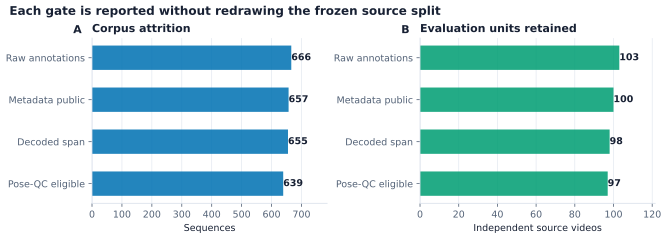

Notebook SVG: C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\work\artifacts\real\figures\bbfm_data_funnel.svg
Paper assets: C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\docs\figures\bbfm_data_funnel.svg C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\docs\figures\bbfm_data_funnel.png C:\Users\alexm\dev\alexpose\experiments\sjepa\gavd5-drift\docs\figures\bbfm_data_funnel.pdf


In [1]:
# Paper and notebook rendering share this single source of truth.
from pathlib import Path as _VisualPath
import os as _visual_os
import sys as _visual_sys


def _find_visual_experiment(start=None):
    start = _VisualPath(start or _VisualPath.cwd()).resolve()
    for candidate in [start, *start.parents]:
        if (candidate / "neurips-brain-body").is_dir() and (candidate / "data-gavd").is_dir():
            return candidate
        nested = candidate / "experiments" / "sjepa" / "gavd5-drift"
        if (nested / "neurips-brain-body").is_dir() and (nested / "data-gavd").is_dir():
            return nested
    raise FileNotFoundError("Could not locate experiments/sjepa/gavd5-drift")


_visual_experiment = _VisualPath(globals().get("EXPERIMENT_DIR", _find_visual_experiment())).resolve()
_visual_notebook_dir = _visual_experiment / "neurips-brain-body"
if str(_visual_notebook_dir) not in _visual_sys.path:
    _visual_sys.path.insert(0, str(_visual_notebook_dir))
try:
    from dotenv import load_dotenv as _visual_load_dotenv
    _visual_load_dotenv(_visual_experiment / ".env", override=False)
except ImportError:
    pass
_visual_mode = str(globals().get("MODE", _visual_os.getenv("GAVD_MODE", "real"))).strip().lower()
_visual_artifact_root = _VisualPath(
    _visual_os.getenv("GAVD_ARTIFACT_DIR", _visual_experiment / "work" / "artifacts")
).expanduser()
_visual_artifact_dir = _VisualPath(globals().get("ARTIFACT_DIR", _visual_artifact_root / _visual_mode))
_visual_outer_fold = int(globals().get("OUTER_FOLD", _visual_os.getenv("SJEPA_OUTER_FOLD", "0")))
_visual_seed = int(globals().get("MODEL_SEED", _visual_os.getenv("SJEPA_MODEL_SEED", "42")))
_visual_objective = str(globals().get("OBJECTIVE_NAME", _visual_os.getenv("SJEPA_OBJECTIVE", "jepa_vicreg")))

from scientific_visuals import render_notebook_summary

visual_summary = render_notebook_summary(
    "01",
    experiment_dir=_visual_experiment,
    artifact_dir=_visual_artifact_dir,
    outer_fold=_visual_outer_fold,
    model_seed=_visual_seed,
    objective=_visual_objective,
)
print("Notebook SVG:", visual_summary.notebook_svg)
print("Paper assets:", visual_summary.paper_svg, visual_summary.paper_png, visual_summary.paper_pdf)
